In [5]:
import numpy as np
import platform
import SarFileIO as sarIO
import cv2 as cv
import os
import scipy.io as scio
import osr
import ogr
import gdal
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import rasterio
import glob
from rasterio.plot import show
from rasterio.mask import mask
from shapely.geometry import mapping
import geopandas as gpd
import math
import rasterio as rio
from osgeo import gdal, gdal_array
import os
import gdal2tiles

In [6]:
import tarfile
# load, split and scale the maps dataset ready for training
from os import listdir
from numpy import asarray
from numpy import vstack
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from numpy import savez_compressed
import numpy as np
from numpy import load
import scipy.io as scio

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output


In [7]:
def Create_SAR_norm(sar_data):
    
    t11 = sar_data
   
    eps = 0.0000000000000001

    pb = 10 * np.log10(t11 + eps)
   

    maxpb=np.max(t11)
    minpb = np.min(t11)
    
    r = (pb - minpb) / (maxpb - minpb)
    r = np.clip(r, 0, 1)
    r = np.float32(255 * r)
   

    return r

In [8]:
def read_band_image(band, path):
    """
    This function takes as input the Sentinel-2 band name and the path of the 
    folder that the images are stored, reads the image and returns the data as
    an array
    input:   band           string            Sentinel-2 band name
             path           string            path of the folder
    output:  data           array (n x m)     array of the band image
             spatialRef     string            projection 
             geoTransform   tuple             affine transformation coefficients
             targetprj                        spatial reference
    """
    a = path+'*B'+band+'*.jp2'
    img = gdal.Open(glob.glob(a)[0])
    data = np.array(img.GetRasterBand(1).ReadAsArray())
    spatialRef = img.GetProjection()
    geoTransform = img.GetGeoTransform()
    targetprj = osr.SpatialReference(wkt = img.GetProjection())
    return data, spatialRef, geoTransform, targetprj

def nbr(band1, band2):
    """
    This function takes an input the arrays of the bands from the read_band_image
    function and returns the Normalized Burn ratio (NBR)
    input:  band1   array (n x m)      array of first band image e.g B8A
            band2   array (n x m)      array of second band image e.g. B12
    output: nbr     array (n x m)      normalized burn ratio
    """
    nbr = (band1 - band2) / (band1 + band2)
    return nbr

def dnbr(nbr1,nbr2):
    """
    This function takes as input the pre- and post-fire NBR and returns the dNBR
    input:  nbr1     array (n x m)       pre-fire NBR
            nbr2     array (n x m)       post-fire NBR
    output: dnbr     array (n x m)       dNBR
    """
    dnbr = nbr1 - nbr2
    return dnbr

def reproject_shp_gdal(infile, outfile, targetprj):
    """
    This function takes as input the input and output file names and the projection
    in which the input file will be reprojected and reprojects the input file using
    gdal
    input:  infile     string      input filename
            outfile    string      output filename
            targetprj              projection (output of function read_band_image)
    """
    ## reprojection with gdal 
    
    driver = ogr.GetDriverByName("ESRI Shapefile") 
    dataSource = driver.Open(infile, 1) # 0 means read-only. 1 means writeable.
    layer = dataSource.GetLayer()
    sourceprj = layer.GetSpatialRef()
    transform = osr.CoordinateTransformation(sourceprj, targetprj)
    
    # Create the output shapefile
    outDriver = ogr.GetDriverByName("Esri Shapefile")
    outDataSource = outDriver.CreateDataSource(outfile)
    outlayer = outDataSource.CreateLayer('', targetprj, ogr.wkbPolygon)
    outlayer.CreateField(ogr.FieldDefn('id', ogr.OFTInteger))
    
    #Iterate over Features
    i = 0
    for feature in layer:
        transformed = feature.GetGeometryRef()
        transformed.Transform(transform) #reproject geometry

        geom = ogr.CreateGeometryFromWkb(transformed.ExportToWkb()) # create geometry from wkb (write geometry of reprojected geometry)
        defn = outlayer.GetLayerDefn() #layer definition
        feat = ogr.Feature(defn)  #create new feature
        feat.SetField('id', i) #set id
        feat.SetGeometry(geom) #set geometry
        outlayer.CreateFeature(feat) 
        i += 1
        feat = None
        
def array2raster(array, geoTransform, projection, filename):
    """ 
    This function tarnsforms a numpy array to a geotiff projected raster
    input:  array                       array (n x m)   input array
            geoTransform                tuple           affine transformation coefficients
            projection                  string          projection
            filename                    string          output filename
    output: dataset                                     gdal raster dataset
            dataset.GetRasterBand(1)                    band object of dataset
    
    """
    pixels_x = array.shape[1]
    pixels_y = array.shape[0]
    
    driver = gdal.GetDriverByName('GTiff')
    dataset = driver.Create(
        filename,
        pixels_x,
        pixels_y,
        1,
        gdal.GDT_Float64, )
    dataset.SetGeoTransform(geoTransform)
    dataset.SetProjection(projection)
    dataset.GetRasterBand(1).WriteArray(array)
    dataset.FlushCache()  # Write to disk.
    return dataset, dataset.GetRasterBand(1)  #If you need to return, remenber to return  also the dataset because the band don`t live without dataset.
 
def clip_raster(filename, shp):
    """
    This function clips a raster based on a shapefile
    input:  filename          string                input raster filename
            shp               dataframe             input shapefile open with geopandas
    output: clipped           array (1 x n x m)     clipped array 
            clipped_meta      dict                  metadata
            cr_ext            tuple                 extent of clipped data
            gt                tuple                 affine transformation coefficients
    """
    inraster = rasterio.open(filename)
    
    extent_geojson = mapping(shp['geometry'][0])
    clipped, crop_affine = mask(inraster, 
                                shapes=[extent_geojson], 
                                nodata = np.nan,
                                crop=True)
    clipped_meta = inraster.meta.copy()
    # Update the metadata to have the new shape (x and y and affine information)
    clipped_meta.update({"driver": "GTiff",
                 "height": clipped.shape[0],
                 "width": clipped.shape[1],
                 "transform": crop_affine})
    cr_ext = rasterio.transform.array_bounds(clipped_meta['height'], 
                                            clipped_meta['width'], 
                                            clipped_meta['transform'])
    
    # transform to gdal
    gt = crop_affine.to_gdal()
    
    return clipped, clipped_meta, cr_ext, gt
    
def reclassify(array):
    """
    This function reclassifies an array
    input:  array           array (n x m)    input array
    output: reclass         array (n x m)    reclassified array
    """
    reclass = np.zeros((array.shape[0],array.shape[1]))
    for i in range(0,array.shape[0]):
        for j in range(0,array.shape[1]):
            if math.isnan(array[i,j]):
                reclass[i,j] = np.nan
            elif array[i,j] < 0.1:
                reclass[i,j] = 1
            elif array[i,j] < 0.27:
                 reclass[i,j] = 2
            elif array[i,j] < 0.44:
                 reclass[i,j] = 3
            elif array[i,j] < 0.66:
                 reclass[i,j] = 4
            else:
                reclass[i,j] = 5
                
    return reclass

In [9]:
def read_band_image(path,dronedata):
    """
    This function takes as input the ldrone image and the path of the 
    folder that the images are stored, reads the image and returns the data as
    an array
    input:   drone          drone image
             path           string            path ,of the folder
    output:  data           array (n x m)     array of the band image
             spatialRef     string            projection 
             geoTransform   tuple             affine transformation coefficients
             targetprj                        spatial reference
    """
    import os
    #img_ds = rio.open(r'T:\Aktive\DSU\3434\52232_Barkbilleskader_S_2\aux_data' + r'\dtm16m_utm32.tif')
    #img_ds1 = rio.open(path + dronedata)
    
    os.chdir(path)
    os.getcwd()
    #img_ds = gdal.Open(glob.glob(a)[0])
    img_ds = gdal.Open(dronedata, gdal.GA_ReadOnly)


    # gdal_rasterize -a HKL_VERDI -ot Float32 -of GTiff  -tr 20 20 -te 591964.4892070280620828 6607127.0049451533704996 609364.4892070280620828 6627967.0049451533704996  -l SKOGBRUKSPLAN_BESTAND_FLATE_0214_d5685 SKOGBRUKSPLAN_BESTAND_FLATE_0214_d5685.shp SKOGBRUKSPLAN_BESTAND_FLATE_0214_d5685_hklverdi.tif
    data = np.zeros((img_ds.RasterYSize, img_ds.RasterXSize, img_ds.RasterCount),
                   gdal_array.GDALTypeCodeToNumericTypeCode(img_ds.GetRasterBand(1).DataType))

    for b in range(data.shape[2]):
        data[:, :, b] = np.array(img_ds.GetRasterBand(b + 1).ReadAsArray())


    
    spatialRef = img_ds.GetProjection()
    geoTransform = img_ds.GetGeoTransform()
    targetprj = osr.SpatialReference(wkt = img_ds.GetProjection())
    return data, spatialRef, geoTransform, targetprj

def ndvi(data):
    """
    This function takes an input the arrays of the bands from the read_band_image
    function and returns the NDVI
    input:  band1   array (n x m)      array of first band image e.g B1
            band2   array (n x m)      array of second band image e.g. B4
    output: ndvi     array (n x m)      normalized vegetation index
    """
    band1=data[:,:,4]
    band2=data[:,:,2]

    ndvi = (band1 - band2) / (band1 + band2)
    return ndvi

def CreateGeoTiff(Name, Array, DataType, NDV,bandnames=None,ref_image=None,GeoT=None, Projection=None):
# If it's a 2D image we fake a third dimension:
    if len(Array.shape)==2:
        Array=np.array([Array])
    if ref_image==None and (GeoT==None or Projection==None):
        raise RuntimeWarning('ref_image or settings required.')
    if bandnames != None:
        if len(bandnames) != Array.shape[0]:
            raise RuntimeError('Need {} bandnames. {} given'
                .format(Array.shape[0],len(bandnames)))
    else:
        bandnames=['Band {}'.format(i+1) for i in range(Array.shape[0])]
    if ref_image!= None:
        refimg=gdal.Open(ref_image)
        GeoT=refimg.GetGeoTransform()
        Projection=refimg.GetProjection()
    driver= gdal.GetDriverByName('GTIFF')
    Array[np.isnan(Array)] = NDV
    DataSet = driver.Create(Name,Array.shape[2],Array.shape[1],Array.shape[0],DataType)
    DataSet.SetGeoTransform(GeoT)
    DataSet.SetProjection( Projection)
    for i, image in enumerate(Array, 1):
        DataSet.GetRasterBand(i).WriteArray( image )
        DataSet.GetRasterBand(i).SetNoDataValue(NDV)
        DataSet.SetDescription(bandnames[i-1])
    DataSet.FlushCache()
    return Name

In [10]:
def visRGB(img1, img2, img3,
           title = 'RGB image',
           scale1 = [],
           scale2 = [],
           scale3 = [],
           flag = 0, outall = ''):
    """
    Visualise the RGB of a single acquisition
    """           
    if scale1 == []:
       scale1 = img1
    if scale2 == []:
       scale2 = img2
    if scale3 == []:
       scale3 = img3

    size = np.shape(img1)           
    iRGB = np.zeros([size[0],size[1],3])
    iRGB[:,:,0] = np.abs(img1)/(np.abs(scale1).mean()*1.5)
    iRGB[:,:,1] = np.abs(img2)/(np.abs(scale2).mean()*1.5)
    iRGB[:,:,2] = np.abs(img3)/(np.abs(scale3).mean()*1.5)
    iRGB[np.abs(iRGB) > 1] = 1
            
#    plt.figure()

    fig = plt.figure(figsize=(8,8))
    ax2 = fig.add_subplot(1,1,1)
    plot = plt.imshow(iRGB); 
    plt.title('(RGB image'); 
    cbar = plt.colorbar(plot,aspect=20); plt.set_cmap('gist_earth'); 
    cbar.set_label('Reflectance',rotation=90,labelpad=20); 
    ax2.ticklabel_format(useOffset=False, style='plain') #do not use scientific notation 
    rotatexlabels = plt.setp(ax2.get_xticklabels(),rotation=90) #rotate x tick labels 90 degrees

    if flag == 1:
        fig.savefig(outall)

    return       
           

In [11]:
dataset_path = '.\Patancheru'
sample_step = 100
sample_size = 128
year=2021
month='Apr'

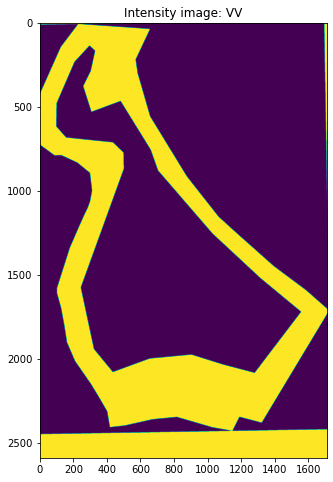

In [12]:
# Paths

if month=='Jan':
    path = r'C:\Users\vaak\Desktop\UoS\weedwatch project\Transfer Learning\Test_GAN\Patancheru\Jan2021'
    inputfile='Orthomosaic_28Jan2021_PatanCheru_AOI_50cm.tif'
elif month=='Feb':
    path = r'C:\Users\vaak\Desktop\UoS\weedwatch project\Transfer Learning\Test_GAN\Patancheru\Feb2021'
    inputfile='Orthomosaic_15Feb2021_PatanCheru_AOI_50cm.tif'
elif month=='Apr':
    path = r'C:\Users\vaak\Desktop\UoS\weedwatch project\Transfer Learning\Test_GAN\Patancheru\Apr2021'
    inputfile='Orthomosaic_30Apr2021_PatanCheru_AOI_50cm.tif'

    
    
# Read drone bands 
(dronedata, crs, geoTransform, targetprj) = read_band_image(path,inputfile)

if month=='Apr':
    mask=dronedata[:,:,1]<65535
    
else:
    mask=dronedata[:,:,5]
    dronedata=dronedata[:,:,:5]
    
fig = plt.figure(figsize=(8,8))
plt.title("Intensity image: VV")
plt.imshow(mask)



In [13]:
dronedata.shape

(2591, 1710, 5)

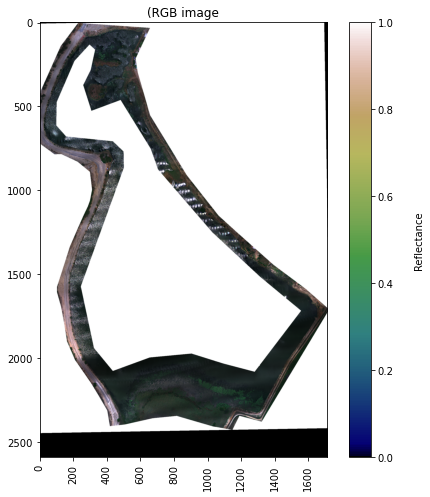

In [14]:
visRGB(dronedata[:,:,2], dronedata[:,:,1], dronedata[:,:,0],
           title = 'RGB image',
           scale1 = [0,20000],
           scale2 = [0,20000],
           scale3 = [0,15000],
           flag = 0, outall = '')

In [15]:
# Paths
if month=='Jan':
    path = r'C:\Users\vaak\Desktop\UoS\weedwatch project\Transfer Learning\Test_GAN\Patancheru\Jan2021'
    inputfile='ICEYE_X7_GRD_SL_40871_20210129T074158_AOI.tif'
elif month=='Feb': 
    path = r'C:\Users\vaak\Desktop\UoS\weedwatch project\Transfer Learning\Test_GAN\Patancheru\Feb2021'
    inputfile='ICEYE_X4_GRD_SL_41789_20210215T093026_AOI.tif'
elif month=='Apr': 
    path = r'C:\Users\vaak\Desktop\UoS\weedwatch project\Transfer Learning\Test_GAN\Patancheru\Apr2021'
    inputfile='ICEYE_X2_GRD_SL_52808_20210430T163904_AOI.tif'

# Read drone bands 
(radardata, crs, geoTransform, targetprj) = read_band_image(path,inputfile)


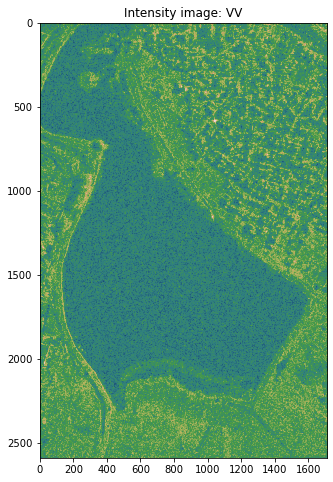

In [16]:
# Same for the VH
iRGBVV = np.abs(radardata)/(np.abs(radardata).mean()*2.5)
iRGBVV[np.abs(iRGBVV) > 1] = 1

# Now plot the RGB for VV
fig = plt.figure(figsize=(8,8))
plt.title("Intensity image: VV")
plt.imshow(iRGBVV)

In [17]:
def norm_dronedata(dronedata):
    
    c1 = dronedata[:, :,0]
    c2 = dronedata[ :, :,1]
    c3 = dronedata[ :, :,2]
    c4 = dronedata[:, :,3]
    c5 = dronedata[:, :,4]






    # normalizing per channel data:
    c1 = (c1 - np.min(c1)) / (np.max(c1) - np.min(c1))
    c2 = (c2 - np.min(c2)) / (np.max(c2) - np.min(c2))
    c3 = (c3 - np.min(c3)) / (np.max(c3) - np.min(c3))
    c4 = (c4 - np.min(c4)) / (np.max(c4) - np.min(c4))
    c5 = (c5 - np.min(c5)) / (np.max(c5) - np.min(c5))



    

    # putting the 5 channels back together:
    dronedata = np.empty(dronedata.shape, dtype=np.float32)
    dronedata[:, :, 0] = c1
    dronedata[:, :, 1] = c2
    dronedata[:, :, 2] = c3
    dronedata[:, :, 3] = c4
    dronedata[:, :, 4] = c5

    return dronedata

In [18]:
dronedata=norm_dronedata(dronedata)

In [19]:
def SampleCount(length):
    count = (length - sample_step) * 1.0 / sample_step
    count = int(count)
    return count

# Tiling the data: drone, satellite and the mask

In [20]:
width = np.shape(dronedata)[1]
height = np.shape(dronedata)[0]
w_count = SampleCount(width)
h_count = SampleCount(height)
total_count =  w_count * h_count

tiles=[]
city_count = 0
for h_c in range(0,h_count):
    for w_c in range(0,w_count):
        h = h_c * sample_step
        w = w_c * sample_step
        sub_drone = dronedata[h:h + sample_size, w:w + sample_size,:5]
        sub_radar = iRGBVV[h:h + sample_size, w:w + sample_size]
        #sub_mask = dronedata[h:h + sample_size, w:w + sample_size,5]
        #if month=='Apr':
        sub_mask = mask[h:h + sample_size, w:w + sample_size]
    

        #np.save(path + '/' + str(city_count), sub_drone,sub_radar,sub_mask)
        scio.savemat(path + '/' + str(city_count) +'.mat', {'drone': sub_drone, 'iceye': sub_radar, 'mask':sub_mask})
        city_count = city_count + 1
    

In [21]:
def load_images(path):    
    s1_list, s2_list,mask_list = list(), list(),list()
    # enumerate filenames in directory, assume all are images
    for filename in listdir(path):
        if filename.endswith('.mat'):
            #print(path + filename)
            pixels = scio.loadmat(path+'\\'+filename)
            s1_img, s2_img,mask_img = pixels['drone'],pixels['iceye'], pixels['mask']
            #print(s1_img.shape)
        
              
            if len(mask_img[mask_img>0])>mask_img.shape[0]*mask_img.shape[1]/1.01:
                s1_list.append(s1_img)
                s2_list.append(s2_img)
                mask_list.append(mask_img)

    return [asarray(s1_list), asarray(s2_list), asarray(mask_list)]

In [22]:

# load dataset
[src_images, tar_images,mask_imsges] = load_images(path)
#src_images=src_images[:,:,:,:5]
print('Loaded: ', src_images.shape, tar_images.shape,mask_imsges.shape)
# save as compressed numpy array
filename = '\maps_'+str(sample_size)+'_'+month+str(year)+'.npz'
savez_compressed(path+filename, src_images, tar_images,mask_imsges)
print('Saved dataset drone & iceye:', path+filename)

Loaded:  (84, 128, 128, 5) (84, 128, 128, 1) (84, 128, 128)
Saved dataset drone & iceye: C:\Users\vaak\Desktop\UoS\weedwatch project\Transfer Learning\Test_GAN\Patancheru\Apr2021\maps_128_Apr2021.npz


Loaded:  (84, 128, 128, 5) (84, 128, 128, 1)


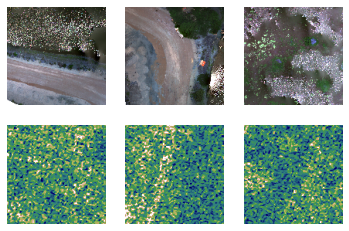

In [23]:
# load the prepared dataset
from numpy import load
from matplotlib import pyplot
from numpy.random import randint


# load the dataset
data = load(path+filename)
src_images, tar_images = data['arr_0'], data['arr_1']
print('Loaded: ', src_images.shape, tar_images.shape)
# plot source images

n_samples = 3

ix = randint(0, src_images.shape[0], n_samples)
    
for i in range(n_samples):
    srcim=src_images[i]
    size = np.shape(srcim)     # this function tell us the size of VV1, we need this 
    iRGB = np.zeros([size[0],size[1],3])    # create the 3D container
    iRGB[:,:,0] = np.abs(srcim[:,:,0])/(np.abs(srcim[:,:,0]).mean()*2.5)
    iRGB[:,:,1] = np.abs(srcim[:,:,1])/(np.abs(srcim[:,:,1]).mean()*2.5)
    iRGB[:,:,2] = np.abs(srcim[:,:,2])/(np.abs(srcim[:,:,2]).mean()*2.5)
    iRGB[np.abs(iRGB) > 1] = 1
    pyplot.subplot(2, n_samples, 1 + i)
    pyplot.axis('off')
    pyplot.imshow(iRGB)

# plot target image
for i in range(n_samples):
	pyplot.subplot(2, n_samples, 1 + n_samples + i)
	pyplot.axis('off')
	pyplot.imshow(np.abs(tar_images[i])/(np.abs(tar_images[i]).mean()*2.5))
pyplot.show()





In [24]:
from numpy import load
from numpy import zeros
from numpy import ones
from numpy.random import randint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import LeakyReLU
from matplotlib import pyplot

In [25]:
filename = '\maps_'+str(sample_size)+'_'+month+str(year)+'.npz'
data = load(path+filename)
src_images, tar_images = data['arr_1'], data['arr_0']
print('Loaded: ', src_images.shape, tar_images.shape)
# plot source images


Loaded:  (84, 128, 128, 1) (84, 128, 128, 5)


In [26]:
def show_image(img, title="No title", figsize=(5,5)):
    img = img.numpy().transpose(1,2,0)
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    
    img = img * std + mean
    np.clip(img, 0, 1)
    
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title)

# How to Develop and Train a Pix2Pix Model

Tying all of this together, the complete code example of training a Pix2Pix GAN to translate satellite photos to Google maps images is listed below.

In [27]:
import numpy as np
import os
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision import models, transforms, datasets

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# Hyper-parameters

    Hyper-parameters suggested by the original paper



In [28]:
bs=1 # suggested by the paper
lr=0.0002 
beta1=0.5
beta2=0.999
NUM_EPOCHS = 200
ngpu = 1
L1_lambda = 100

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Function to initialize model's weights

In [29]:
def weights_init(m):
    name = m.__class__.__name__
    
    if(name.find("Conv") > -1):
        nn.init.normal_(m.weight.data, 0.0, 0.02) # ~N(mean=0.0, std=0.02)
    elif(name.find("BatchNorm") > -1):
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0.0)

# 1.1 Generator - Architecture

    

* The architecture is U-Net 128

* In 1 x 128 x 128 - Encoder C32 - C64 - C128 - C256 - C256 - C256
- C256 (Latent space)
* Decoder DC512 - DC512- DC512- DC256- DC128- DC64- Out 5 x 128 x 128
* Reference: https://arxiv.org/pdf/1505.04597.pdf



In [30]:
"""
    The Generator is a U-Net 128 with skip connections between Encoder and Decoder
"""

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        
        """
        ===== Encoder ======
        
        * Encoder has the following architecture:
        0) Inp1
        1) C32 
        2) Leaky, C64, Norm 
        3) Leaky, C128, Norm 
        4) Leaky, C256, Norm 
        5) Leaky, C256, Norm 
        6) Leaky, C256, Norm 
        7) Leaky, C256
        
        * The structure of 1 encoder block is:
        1) LeakyReLU(prev layer)
        2) Conv2D
        3) BatchNorm
        
        Where Conv2D has kernel_size-4, stride=2, padding=1 for all layers
        """
        self.encoder1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=4, stride=2, padding=1, bias=False)
        
        self.encoder2 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64)
        )
        
        self.encoder3 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
        )
        
        self.encoder4 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256)
        )
        
        self.encoder5 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256)
        )
        
        self.encoder6 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256)
        )
        
        self.encoder7 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False)
        )
        
        """
        ===== Decoder =====
        * Decoder has the following architecture:
        1) ReLU(from latent space), DC256, Norm, Drop 0.5 - Residual
        2) ReLU, DC256, Norm, Drop 0.5, Residual
        3) ReLU, DC256, Norm, Drop 0.5, Residual
        4) ReLU, DC128, Norm, Residual
        5) ReLU, DC64, Norm, Residual
        6) ReLU, DC32, Norm, Residual
        7) ReLU, DC5, Tanh()
        
        * Note: only apply Dropout in the first 3 Decoder layers
        
        * The structure of each Decoder block is:
        1) ReLU(from prev layer)
        2) ConvTranspose2D
        3) BatchNorm
        4) Dropout
        5) Skip connection
        
        Where ConvTranpose2D has kernel_size=4, stride=2, padding=1
        """
        
        
        self.decoder1 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=256, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.Dropout(0.5)
        )
        # skip connection in forward()
        
        self.decoder2 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=256*2, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.Dropout(0.5)
        )
        # skip connection in forward()
        
        self.decoder3 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=256*2, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.Dropout(0.5)
        )
        # skip connection in forward()
        
        self.decoder4 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=256*2, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            #nn.Dropout(0.5)
        )
        
        self.decoder5 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=128*2, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            #nn.Dropout(0.5)
        )
        
        self.decoder6 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=64*2, out_channels=32, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            #nn.Dropout(0.5)
        )
        
        self.decoder7 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=32*2, out_channels=5, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)
        e5 = self.encoder5(e4)
        e6 = self.encoder6(e5)
        
        latent_space = self.encoder7(e6)
        
        d1 = torch.cat([self.decoder1(latent_space), e6], dim=1)
        d2 = torch.cat([self.decoder2(d1), e5], dim=1)
        d3 = torch.cat([self.decoder3(d2), e4], dim=1)
        d4 = torch.cat([self.decoder4(d3), e3], dim=1)
        d5 = torch.cat([self.decoder5(d4), e2], dim=1)
        d6 = torch.cat([self.decoder6(d5), e1], dim=1)
        
        out = self.decoder7(d6)
        
        return out

# 1.2 Generator - Initialization

In [31]:
model_G = Generator(ngpu=1)

if(device == "cuda" and ngpu > 1):
    model_G = nn.DataParallel(model_G, list(range(ngpu)))
    
model_G.apply(weights_init)
model_G.to(device)

Generator(
  (encoder1): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (encoder2): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace=True)
    (1): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (encoder3): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace=True)
    (1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (encoder4): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace=True)
    (1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (encoder5): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace=True)
    (1): Conv2d(256, 256, kernel_size

# 2.1 Discriminator - Architecture


* PatchGan Discriminator with receptive field of each patch is **rf = 70x70**
* Structure is **C64 (no norm, 4,2,1)-C128 (4,2,1)-C256 (4,2,1)-C512 (4,1,1) - Channel 1 (4,1,1)**, where C is Convolution - BatchNorm - LeakyReLU
* Activations are **LeakyReLU(0.2)**
* BatchNorm is applied to all layers but C64
* Last 2 layers has **kernel_size=4, stride=1, padding=1**

In [34]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        
        self.structure = nn.Sequential(
            nn.Conv2d(in_channels=3*2, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=64, out_channels= 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1, padding=1, bias=False),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        return self.structure(x)

# 2.2 Discriminator Initialization

In [35]:
model_D = Discriminator(ngpu=1)

if(device == "cuda" and ngpu>1):
    model_D = torch.DataParallel(model_D, list(rang(ngpu)))
    
model_D.apply(weights_init)
model_D.to(device)

Discriminator(
  (structure): Sequential(
    (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [36]:
criterion = nn.BCELoss()

optimizerD = optim.Adam(model_D.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = optim.Adam(model_G.parameters(), lr=lr, betas=(beta1, beta2))

NUM_EPOCHS=171
model_D.to(device)
model_G.to(device)


Generator(
  (encoder1): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (encoder2): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace=True)
    (1): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (encoder3): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace=True)
    (1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (encoder4): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace=True)
    (1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (encoder5): Sequential(
    (0): LeakyReLU(negative_slope=0.2, inplace=True)
    (1): Conv2d(256, 256, kernel_size

In [37]:
L1_lambda = 100
NUM_EPOCHS= 50

In [39]:
src_images.shape[0]

84

In [40]:
src_images, tar_images = data['arr_1'], data['arr_0']

src_images=src_images.reshape(src_images.shape[0],1,128,128)
tar_images=tar_images.reshape(src_images.shape[0],5,128,128)
print(src_images.shape)
print(tar_images.shape)
data_real = torch.cat([torch.from_numpy(np.float32(src_images)), torch.from_numpy(np.float32(tar_images))], dim=1)
print(data_real.shape)



(84, 1, 128, 128)
(84, 5, 128, 128)
torch.Size([84, 6, 128, 128])


In [32]:


for epoch in range(NUM_EPOCHS+1):
    print(f"Training epoch {epoch+1}")
    for _, real_data in enumerate(data_real[0:,:,:,:]):
        real_data = real_data.unsqueeze(0)
        inputs=real_data[:,0,:,:].to(device) # input image data
        targets=real_data[:,1:,:,:].to(device) # input image data

        inputs = inputs.unsqueeze(0)
        targets = targets.unsqueeze(0)

        outputs = model_D(real_data.to(device)) # label "real" data
        labels = torch.ones(size = outputs.shape, dtype=torch.float, device=device)
        
        lossD_real = 0.5 * criterion(outputs, labels) # divide the objective by 2 -> slow down D
        lossD_real.backward()
        
        # Train on fake data
        # Maximize log(1-D(x,G(x))) <- minimize D(x,G(x))
        gens = model_G(inputs).detach()
        fake_data = torch.cat([inputs, gens], dim=1) # generated image data
        outputs = model_D(fake_data)
        labels = torch.zeros(size = outputs.shape, dtype=torch.float, device=device) # label "fake" data
        
        lossD_fake = 0.5 * criterion(outputs, labels) # divide the objective by 2 -> slow down D
        lossD_fake.backward()
        
        optimizerD.step()
        
        # ========= Train Generator x2 times ============
        # maximize log(D(x, G(x)))
        for i in range(2):
            model_G.zero_grad()
            
            gens = model_G(inputs)
            
            gen_data = torch.cat([inputs, gens], dim=1) # concatenated generated data
            outputs = model_D(gen_data)
            labels = torch.ones(size = outputs.shape, dtype=torch.float, device=device)
            
            lossG = criterion(outputs, labels) + L1_lambda * torch.abs(gens-targets).sum()
            lossG.backward()
            optimizerG.step()
            
    if(epoch%5==0):
        torch.save(model_G, "./sat2droneGen_v1.3.pth")
        torch.save(model_D, "./sat2droneDisc_v1.3.pth")
    
print("Done!") 
    

Training epoch 1
Training epoch 2
Training epoch 3
Training epoch 4
Training epoch 5
Training epoch 6
Training epoch 7
Training epoch 8
Training epoch 9
Training epoch 10
Training epoch 11
Training epoch 12
Training epoch 13
Training epoch 14
Training epoch 15
Training epoch 16
Training epoch 17
Training epoch 18
Training epoch 19
Training epoch 20
Training epoch 21
Training epoch 22
Training epoch 23
Training epoch 24
Training epoch 25
Training epoch 26
Training epoch 27
Training epoch 28
Training epoch 29
Training epoch 30
Training epoch 31
Training epoch 32
Training epoch 33
Training epoch 34
Training epoch 35
Training epoch 36
Training epoch 37
Training epoch 38
Training epoch 39
Training epoch 40
Training epoch 41
Training epoch 42
Training epoch 43
Training epoch 44
Training epoch 45
Training epoch 46
Training epoch 47
Training epoch 48
Training epoch 49
Training epoch 50
Training epoch 51
Done!


In [44]:
pwd

'C:\\Users\\vaak\\Desktop\\UoS\\weedwatch project\\Transfer Learning\\Test_GAN\\Patancheru\\Apr2021'

Loaded:  (84, 128, 128, 1) (84, 128, 128, 5)
(84, 1, 128, 128)
(84, 5, 128, 128)
torch.Size([84, 6, 128, 128])
torch.Size([1, 5, 128, 128])


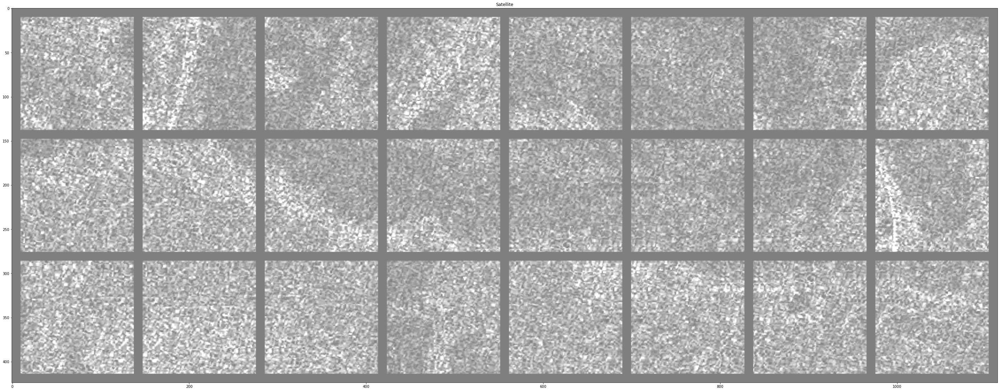

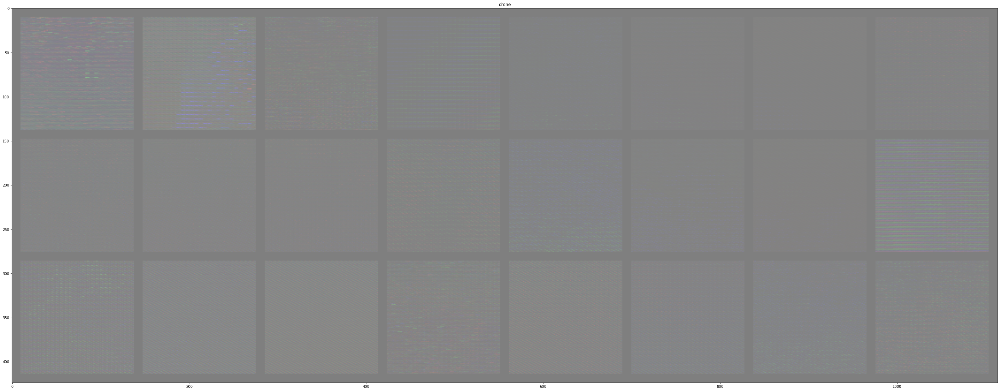

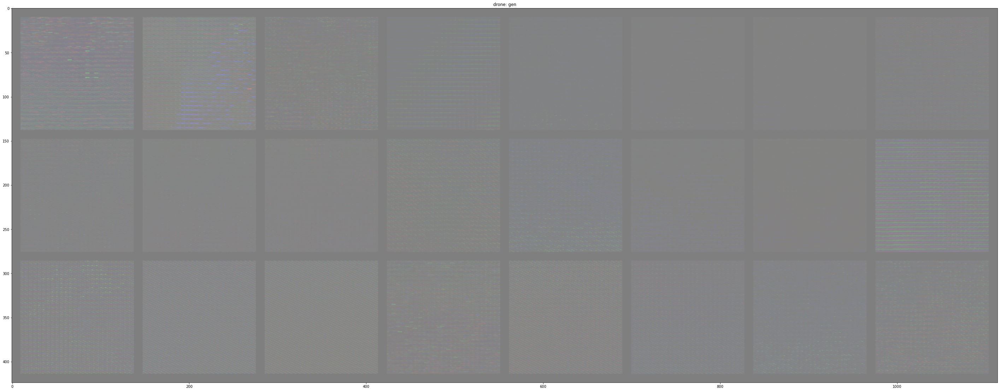

In [122]:
#dataset_path = '.\Patancheru'
#sample_step = 100
#sample_size = 128
#year=2021
#month='April'
filename = '\maps_'+str(sample_size)+'_'+month+str(year)+'.npz'
test_data = load(path+filename)
src_images, tar_images = test_data['arr_1'], test_data['arr_0']
print('Loaded: ', src_images.shape, tar_images.shape)

src_images=src_images.reshape(84,1,128,128)
tar_images=tar_images.reshape(84,5,128,128)
print(src_images.shape)
print(tar_images.shape)
data_real = torch.cat([torch.from_numpy(np.float32(src_images)), torch.from_numpy(np.float32(tar_images))], dim=1)
print(data_real.shape)

model_G = torch.load("C:\\Users\\vaak\\Desktop\\UoS\\weedwatch project\\Transfer Learning\\Test_GAN\\Patancheru\\Feb2021\\sat2droneGen_v1.3.pth")
model_G.apply(weights_init)


satellite=data_real[:24,:1,:,:].to(device) # input image data
drone=data_real[:24,1:,:,:].to(device) # input image data

#satellite = satellite.unsqueeze(0)
#targets = targets.unsqueeze(0)
print(targets.shape)
       
gen = model_G(satellite)
satellite = satellite.detach().cpu()
gen = gen.detach().cpu()
drone = drone.detach().cpu()

show_image(torchvision.utils.make_grid(satellite, padding=10), title="Satellite", figsize=(50,50))

show_image(torchvision.utils.make_grid(drone[:,1:4,:,:], padding=10), title="drone", figsize=(50,50))

show_image(torchvision.utils.make_grid(drone[:,1:4,:,:], padding=10), title="drone: gen", figsize=(50,50))



In [118]:
gen.shape

torch.Size([1, 5, 128, 128])

# Random Experiment zone (trivial stuffs)

In [101]:
satellite=data_real[:7,:1,:,:].to(device) # input image data
drone=data_real[:7,1:,:,:].to(device) # input image data

print(satellite.shape)
print(drone.shape)

data_real = torch.cat([satellite, drone], dim=1)
print(data_real.shape)

transformmm = transforms.Compose([
    transforms.RandomVerticalFlip(p=1),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

dataloaderrrr = torch.utils.data.DataLoader(data_real, batch_size=1, shuffle=True, num_workers=0)



torch.Size([7, 1, 128, 128])
torch.Size([7, 5, 128, 128])
torch.Size([7, 6, 128, 128])


In [104]:
name = "TransposeConv2d"
print(name.find("Conv"))

9


In [105]:
a = torch.ones(size=(8,3,5,5))
b = torch.zeros(size=(8,3,5,5))

c=torch.abs(a-b).sum()

tensor(600.)

In [117]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

batch_size = 4

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data\cifar-10-python.tar.gz to ./data


In [130]:
trainset

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: ./data
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )

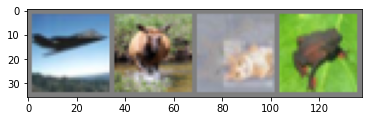

plane deer  cat   frog 


In [128]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join(f'{classes[labels[j]]:5s}' for j in range(batch_size)))